In [4]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
import zipfile

In [0]:
zip_ref = zipfile.ZipFile("/content/gdrive/My Drive/creditcardfraud.zip", 'r')
zip_ref.extractall()
zip_ref.close()



In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as plt
from sklearn.preprocessing import StandardScaler, RobustScaler
import matplotlib.pyplot as plt


In [0]:
data=pd.read_csv("creditcard.csv")

In [6]:
data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [7]:
data['Class'].value_counts()

0    284315
1       492
Name: Class, dtype: int64

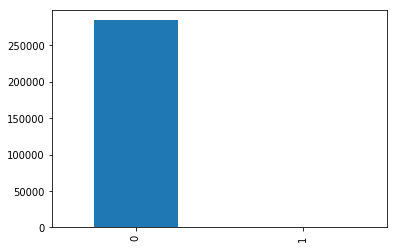

In [8]:
data['Class'].value_counts().plot(kind='bar')

In [12]:
data.shape

(284807, 31)

In [0]:
data.isnull().sum()

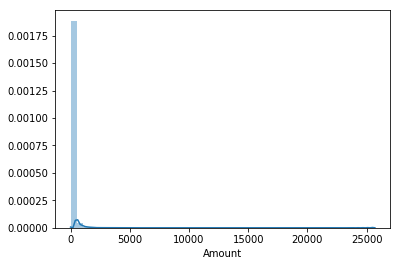

In [16]:
sns.distplot(data['Amount'])

In [0]:
rob_scaler = RobustScaler()
data['scaled_amount'] = rob_scaler.fit_transform(data['Amount'].values.reshape(-1,1))
data['scaled_time'] = rob_scaler.fit_transform(data['Time'].values.reshape(-1,1))


In [0]:
data.drop(['Amount','Time'],axis=1,inplace=True)

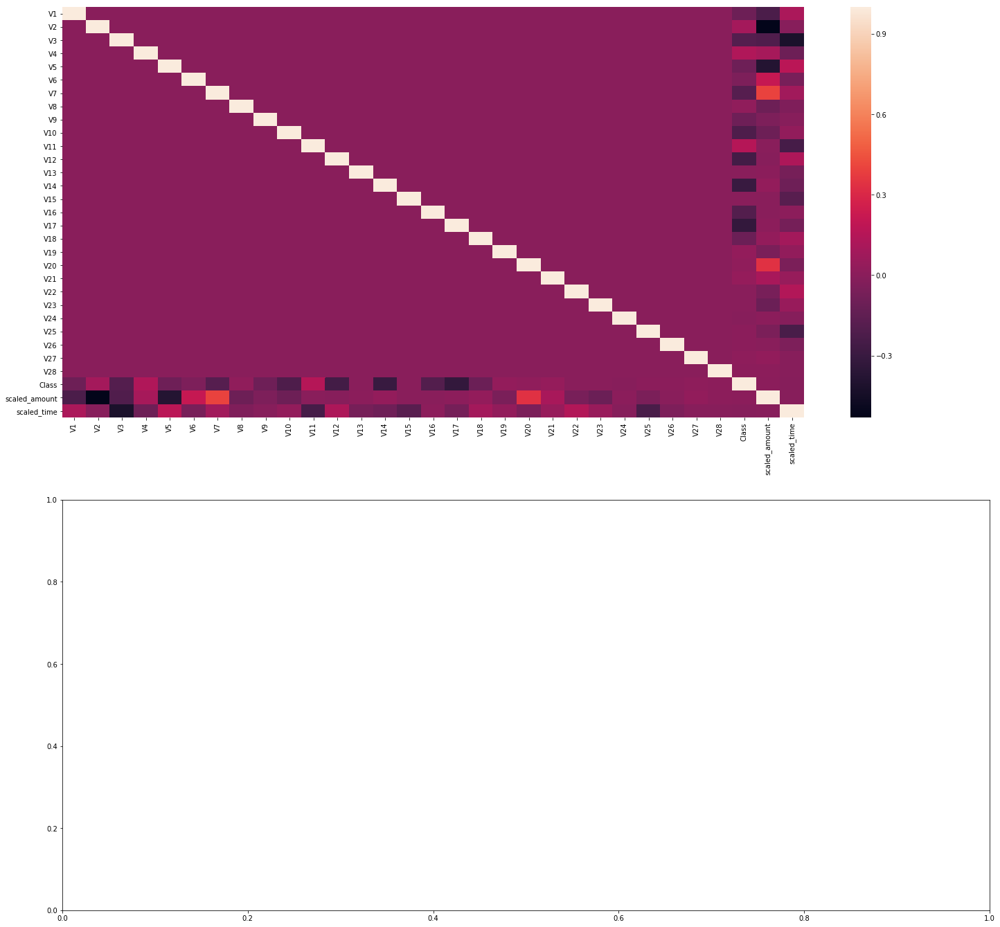

In [10]:
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(24,24))
corr=data.corr()
#sns.heatmap(corr, annot_kws={'size':20})
sns.heatmap(corr, annot_kws={'size':31}, ax=ax1)
plt.show()

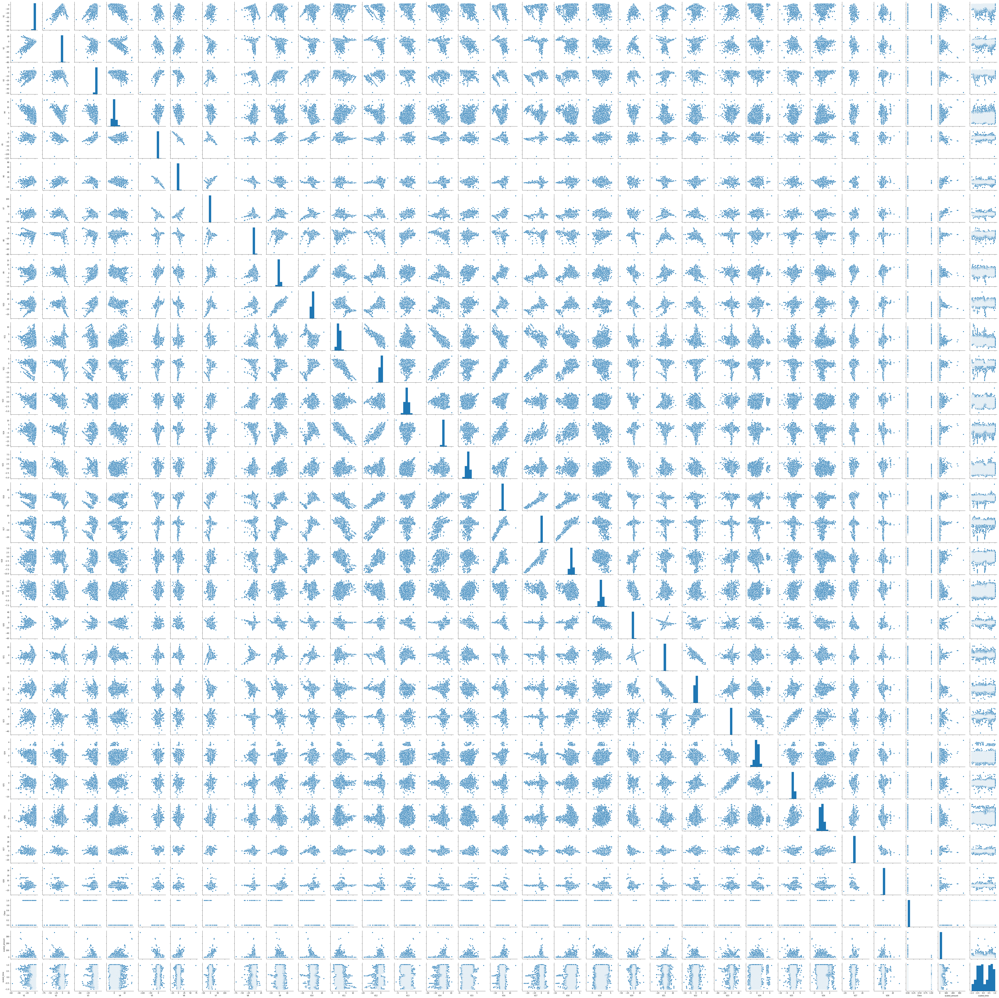

In [6]:
sns.pairplot(data)

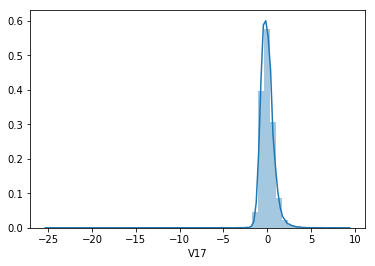

In [13]:
sns.distplot(data['V17'])

In [0]:
target=data['Class']


In [0]:
data.drop(['Class'],axis=1,inplace=True)

In [0]:
from sklearn.model_selection import train_test_split

In [0]:
X_train, X_test, y_train, y_test = train_test_split(data.values, target, test_size=0.2, random_state=42)

In [14]:
from keras import Sequential
from keras.layers import Dense

Using TensorFlow backend.


In [0]:
input_dimen=data.shape[1]

In [16]:
model=Sequential()
model.add(Dense(10, activation='relu', kernel_initializer='random_normal', input_dim=input_dimen))
model.add(Dense(5, activation='relu', kernel_initializer='random_normal'))
model.add(Dense(1, activation='sigmoid', kernel_initializer='random_normal'))

W0813 13:14:45.068016 139781027178368 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0813 13:14:45.117329 139781027178368 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0813 13:14:45.125052 139781027178368 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4115: The name tf.random_normal is deprecated. Please use tf.random.normal instead.



In [17]:
model.compile(optimizer ='adam',loss='binary_crossentropy', metrics =['accuracy'])

W0813 13:14:49.083297 139781027178368 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.

W0813 13:14:49.121816 139781027178368 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:3376: The name tf.log is deprecated. Please use tf.math.log instead.

W0813 13:14:49.131103 139781027178368 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/nn_impl.py:180: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [18]:
model.fit(X_train,y_train,batch_size=1024,epochs=20)

W0813 13:14:53.575726 139781027178368 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:986: The name tf.assign_add is deprecated. Please use tf.compat.v1.assign_add instead.



Epoch 1/20
227845/227845 [==============================] - 6s 25us/step - loss: 0.5116 - acc: 0.9884
Epoch 2/20
227845/227845 [==============================] - 1s 5us/step - loss: 0.0701 - acc: 0.9983
Epoch 3/20
227845/227845 [==============================] - 1s 5us/step - loss: 0.0146 - acc: 0.9983
Epoch 4/20
227845/227845 [==============================] - 1s 5us/step - loss: 0.0083 - acc: 0.9983
Epoch 5/20
227845/227845 [==============================] - 1s 5us/step - loss: 0.0064 - acc: 0.9983
Epoch 6/20
227845/227845 [==============================] - 1s 5us/step - loss: 0.0055 - acc: 0.9983
Epoch 7/20
227845/227845 [==============================] - 1s 5us/step - loss: 0.0051 - acc: 0.9983
Epoch 8/20
227845/227845 [==============================] - 1s 5us/step - loss: 0.0048 - acc: 0.9983
Epoch 9/20
227845/227845 [==============================] - 1s 5us/step - loss: 0.0046 - acc: 0.9983
Epoch 10/20
227845/227845 [==============================] - 1s 5us/step - loss: 0.0044 - 

In [19]:
eval_model=model.evaluate(X_train, y_train)
eval_model

227845/227845 [==============================] - 11s 47us/step


[0.002734158993971965, 0.9994469924729531]

In [0]:
y_pred=model.predict(X_test)

In [0]:
y_pred=y_pred.argmax(axis=1)

In [0]:
from sklearn.metrics import confusion_matrix, accuracy_score

In [27]:
accuracy_score(y_test, y_pred)*100

99.82795547909133

In [28]:
confusion_matrix(y_test, y_pred)

array([[56864,     0],
       [   98,     0]])

In [0]:
from sklearn.metrics import classification_report


In [39]:
target_names = ['class 0', 'class 1']
print(classification_report(y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

     class 0       1.00      1.00      1.00     56864
     class 1       0.00      0.00      0.00        98

    accuracy                           1.00     56962
   macro avg       0.50      0.50      0.50     56962
weighted avg       1.00      1.00      1.00     56962



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
